In [1]:
import requests
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose

import seaborn as sns

In [2]:
def download_covid_data(url, filename):
    # Enviar una solicitud GET a la URL
    response = requests.get(url)

    # Verificar si la solicitud fue exitosa
    if response.status_code == 200:
        # Escribir el contenido en un archivo
        with open(filename, 'wb') as file:
            file.write(response.content)
        print(f"Archivo descargado con éxito: {filename}")
    else:
        print(f"Fallo en la descarga del archivo. Código : {response.status_code}")


url = 'https://api.covidtracking.com/v1/states/daily.csv'
filename = 'us_daily_state_covid_data.csv'
download_covid_data(url, filename)

Archivo descargado con éxito: us_daily_state_covid_data.csv


Función para descargarnos el archivo sobre el que vamos a trabajar

In [3]:
df = pd.read_csv('us_daily_state_covid_data.csv')

# Mostrar información básica sobre el DataFrame
print("Información del DataFrame:")
df.info()

print("\nForma del DataFrame:")
print(f"Número de filas: {df.shape[0]}")
print(f"Número de columnas: {df.shape[1]}")

print("\nNombres de las columnas:")
print(df.columns.tolist())

print("\nPrimeras filas del DataFrame:")
print(df.head())

print("\nEstadísticas resumidas:")
print(df.describe())

Información del DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   date                         20780 non-null  int64  
 1   state                        20780 non-null  object 
 2   positive                     20592 non-null  float64
 3   probableCases                9271 non-null   float64
 4   negative                     13290 non-null  float64
 5   pending                      2138 non-null   float64
 6   totalTestResultsSource       20780 non-null  object 
 7   totalTestResults             20614 non-null  float64
 8   hospitalizedCurrently        17339 non-null  float64
 9   hospitalizedCumulative       12382 non-null  float64
 10  inIcuCurrently               11636 non-null  float64
 11  inIcuCumulative              3789 non-null   float64
 12  onVentilatorCurrently        9126 non-null   fl

Leemos el archivo csv, y sacamos una primera información básica sobre los datos, como el nombre de las columnas,el número total de filas, tipo de datos....

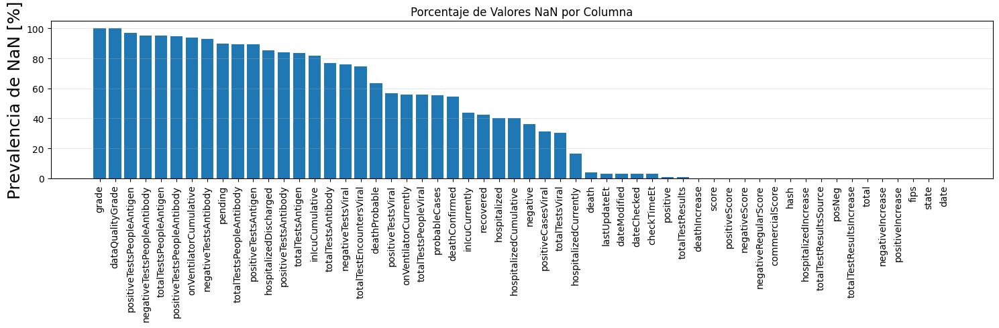

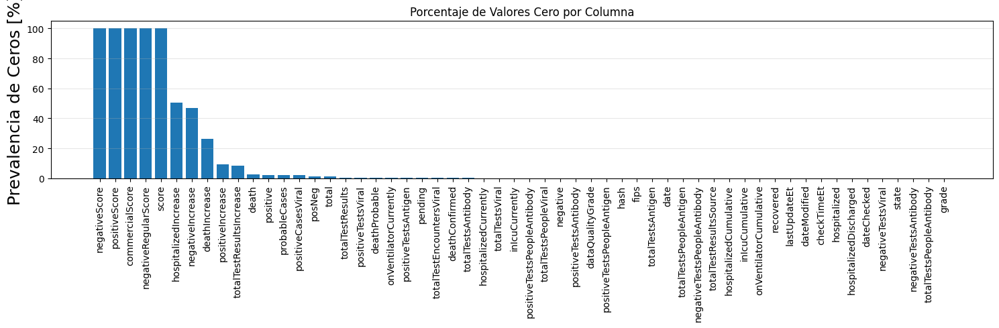

In [4]:
# Calcular el porcentaje de NaN y ceros
total_nans = df.isnull().sum().sort_values(ascending=False)
percent_nans = (df.isnull().sum() / df.isnull().count() * 100).sort_values(ascending=False)
total_zeros = df.isin([0]).sum().sort_values(ascending=False)
percent_zeros = (df.isin([0]).sum() / df.isin([0]).count() * 100).sort_values(ascending=False)

# Crear DataFrames para estadísticas de NaN y ceros
df_nans = pd.concat([total_nans, percent_nans], axis=1, keys=['Total NaN', 'Porcentaje NaN'])
df_zeros = pd.concat([total_zeros, percent_zeros], axis=1, keys=['Total Ceros', 'Porcentaje Ceros'])


# Graficar porcentajes de NaN
plt.figure(figsize=(15, 5))
plt.bar(np.arange(len(df_nans)), df_nans['Porcentaje NaN'].values)
plt.xticks(np.arange(len(df_nans)), df_nans.index, rotation='vertical')
plt.ylabel('Prevalencia de NaN [%]', fontsize=18)
plt.title('Porcentaje de Valores NaN por Columna')
plt.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.show()
plt.close()

# Graficar porcentajes de Ceros
plt.figure(figsize=(15, 5))
plt.bar(np.arange(len(df_zeros)), df_zeros['Porcentaje Ceros'].values)
plt.xticks(np.arange(len(df_zeros)), df_zeros.index, rotation='vertical')
plt.ylabel('Prevalencia de Ceros [%]', fontsize=18)
plt.title('Porcentaje de Valores Cero por Columna')
plt.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

En los gráficos anteriores, observamos como los valores NaN y '0' para algunas colmunas son bastante elevados.

Realizamos un filtrado del df con las columnas que nos parecen más interesantes para analizar

In [5]:
# Lista de columnas relevantes
relevant_columns = ['date', 'state', 'fips', 'positiveIncrease', 'negativeIncrease', 'total', 'totalTestResultsIncrease',
                 'posNeg', 'totalTestResultsSource', 'hospitalizedIncrease', 'hash', 'positiveScore', 'negativeScore',
                 'commercialScore', 'negativeRegularScore', 'score', 'deathIncrease', 'totalTestResults', 'positive',
                 'checkTimeEt', 'dateChecked', 'dateModified', 'lastUpdateEt', 'death', 'hospitalizedCurrently']


# Nos quedamos con esas columnas para el análisis
df_clean = df[relevant_columns]


In [6]:
# Convertir la fecha a datetime
df['date'] = pd.to_datetime(df['date'], format='%Y%m%d')

# Ordenar por fecha
df = df.sort_values('date')
df.reset_index(drop= True, inplace=True)

In [7]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.palettes import Spectral11
import itertools

# Activar la salida en Jupyter
output_notebook()

# Filtrar y preparar los datos

df_grouped = df.groupby(['date', 'state'])['positive'].sum().reset_index()

# Crear una fuente de datos
source = ColumnDataSource(df_grouped)

# Crear el gráfico
p = figure(x_axis_type='datetime', title='Evolución de Casos Positivos de COVID-19 en EE.UU.',
           height=400, width=900)

# Añadir una línea por cada estado
estados = df['state'].unique()
# Generar una paleta de colores personalizada para más de 20 estados
colors = list(itertools.islice(itertools.cycle(Spectral11), len(estados)))

for i, estado in enumerate(estados):
    estado_df = df_grouped[df_grouped['state'] == estado]
    p.line('date', 'positive', source=ColumnDataSource(estado_df), legend_label=estado, line_width=2, color=colors[i])

# Configuración del hover tool
hover = HoverTool(tooltips=[('Fecha', '@date{%F}'), ('Positivos', '@positive{0,0}'), ('Estado', '@state')],
                  formatters={'@date': 'datetime'})
p.add_tools(hover)

p.legend.location = 'top_left'
p.xaxis.axis_label = 'Fecha'
p.yaxis.axis_label = 'Número de Casos Positivos'

show(p)

Loading BokehJS ...

Este gráfico de líneas de tiempo muestra la evolución de los casos positivos en todos los estados seleccionados. Al pasar el cursor sobre cualquier punto de las líneas, se muestra la fecha exacta y el número de casos positivos.
Cabe destacar como fluctuan los positivos sobre todo en los estados de CA,TX,NY,FL, que son los que aparentemente sufren diferentes olas de incremento de personas positivas en COVID.

In [8]:
#Visualizar la distribución de casos positivos por estado en un mapa de EE.UU.
import plotly.express as px

# Agrupar los datos por estado y sumar los casos positivos
df_state_sum = df.groupby('state').agg({'positive': 'sum'}).reset_index()

# Crear un mapa coroplético
fig = px.choropleth(df_state_sum, locations='state', locationmode="USA-states", color='positive',
                    color_continuous_scale="Viridis", scope="usa",
                    labels={'positive': 'Casos Positivos'},
                    title="Distribución de Casos Positivos de COVID-19 en EE.UU.")

fig.update_layout(geo=dict(bgcolor= 'rgba(0,0,0,0)'))
fig.show()


Gráfico de mapa coroplético:
Nos representa en forma de mapa de calor y muy visual los estados y el numero de casos positivos que ha habido en total durante todo el estudio.


In [9]:
# Agregar los datos a nivel nacional
national_df = df.groupby('date').agg({
    'positiveIncrease': 'sum',
    'deathIncrease': 'sum',
    'totalTestResultsIncrease': 'sum',
    'hospitalizedIncrease': 'sum',
    'positive': 'sum',
    'death': 'sum',
    'total': 'sum',
    'hospitalizedCurrently': 'sum'
}).reset_index()

# Calcular estadísticas diarias
national_df['daily_positivity_rate'] = national_df['positiveIncrease'] / national_df['totalTestResultsIncrease']
national_df['daily_death_rate'] = national_df['deathIncrease'] / national_df['positiveIncrease']



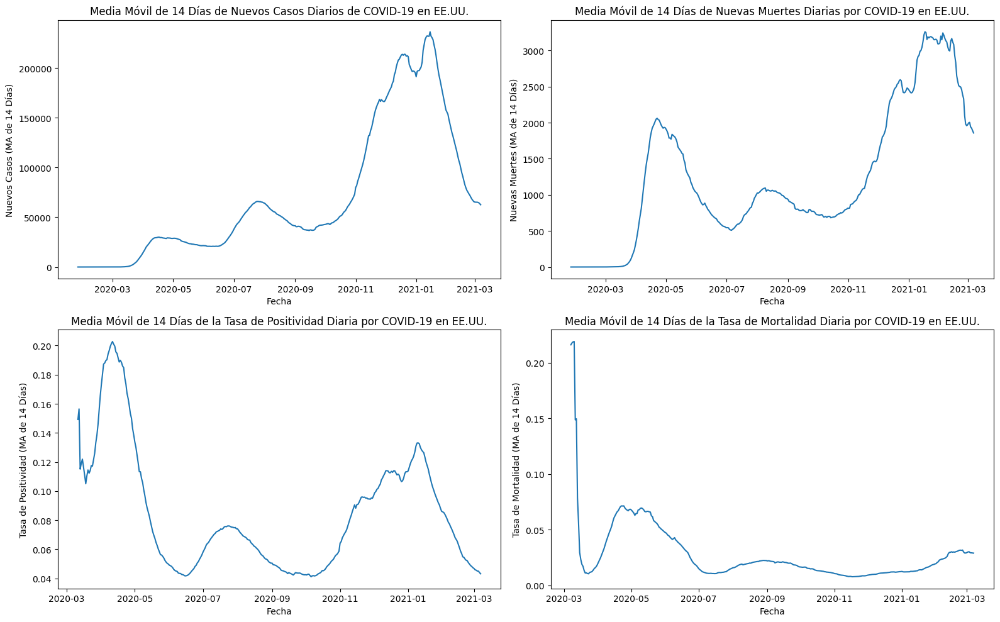

In [10]:
# Calcular medias móviles de 14 períodos
national_df['positiveIncrease_MA'] = national_df['positiveIncrease'].rolling(window=14).mean()
national_df['deathIncrease_MA'] = national_df['deathIncrease'].rolling(window=14).mean()
national_df['daily_positivity_rate_MA'] = national_df['daily_positivity_rate'].rolling(window=14).mean()
national_df['daily_death_rate_MA'] = national_df['daily_death_rate'].rolling(window=14).mean()

# Graficar medias móviles de 14 períodos de las tendencias nacionales
fig, axs = plt.subplots(2, 2, figsize=(16, 10))

# Nuevos casos (media móvil de 14 días)
axs[0, 0].plot(national_df['date'], national_df['positiveIncrease_MA'])
axs[0, 0].set_title('Media Móvil de 14 Días de Nuevos Casos Diarios de COVID-19 en EE.UU.')
axs[0, 0].set_xlabel('Fecha')
axs[0, 0].set_ylabel('Nuevos Casos (MA de 14 Días)')

# Nuevas muertes (media móvil de 14 días)
axs[0, 1].plot(national_df['date'], national_df['deathIncrease_MA'])
axs[0, 1].set_title('Media Móvil de 14 Días de Nuevas Muertes Diarias por COVID-19 en EE.UU.')
axs[0, 1].set_xlabel('Fecha')
axs[0, 1].set_ylabel('Nuevas Muertes (MA de 14 Días)')

# Tasa de positividad (media móvil de 14 días)
axs[1, 0].plot(national_df['date'], national_df['daily_positivity_rate_MA'])
axs[1, 0].set_title('Media Móvil de 14 Días de la Tasa de Positividad Diaria por COVID-19 en EE.UU.')
axs[1, 0].set_xlabel('Fecha')
axs[1, 0].set_ylabel('Tasa de Positividad (MA de 14 Días)')

# Tasa de mortalidad (media móvil de 30 días)
axs[1, 1].plot(national_df['date'], national_df['daily_death_rate_MA'])
axs[1, 1].set_title('Media Móvil de 14 Días de la Tasa de Mortalidad Diaria por COVID-19 en EE.UU.')
axs[1, 1].set_xlabel('Fecha')
axs[1, 1].set_ylabel('Tasa de Mortalidad (MA de 14 Días)')

plt.tight_layout()
plt.show()

- El análisis revela fluctuaciones en los nuevos casos y muertes diarias a lo largo del tiempo.
- Las medias móviles de 14 días muestran tendencias más claras, suavizando las variaciones diarias.
- Las múltiples olas de infecciones vienen indicadas por picos en las medias móviles.

Text(0, 0.5, 'Muertes Totales')

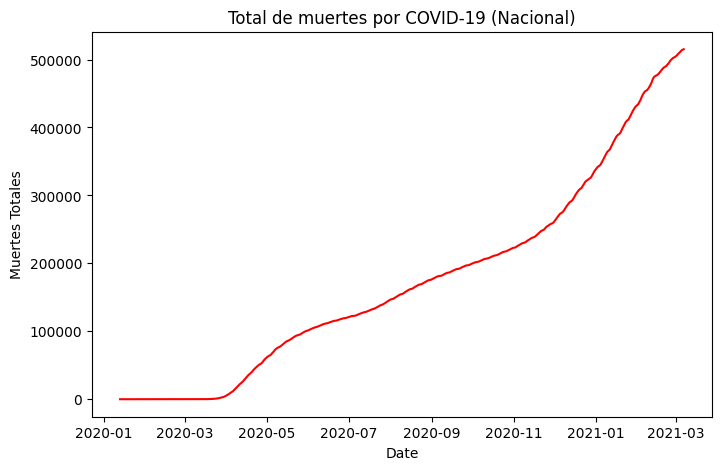

In [11]:
# Totales acumulados
national_df['total_deaths'] = national_df['deathIncrease'].cumsum()
national_df['total_hospitalizations'] = national_df['hospitalizedIncrease'].cumsum()

# Graficamos
fig, ax = plt.subplots(1, 1, figsize=(8, 5))

# Muertes totales
ax.plot(national_df['date'], national_df['total_deaths'], color='red')
ax.set_title('Total de muertes por COVID-19 (Nacional)')
ax.set_xlabel('Date')
ax.set_ylabel('Muertes Totales')




En este gráfico podemos observar el total de muertes acumuladas a nivel nacional durante todo el estudio. En Marzo de 2021 se acumularon más de 500.000 muertes desde enero de 2021 en todos los estados.


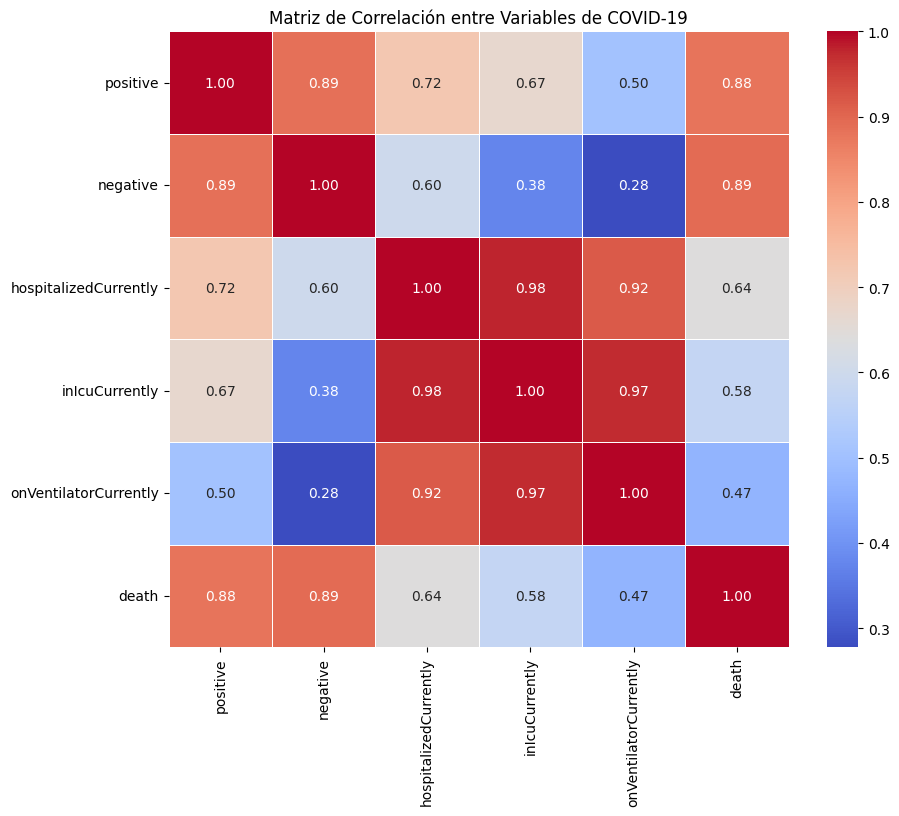

In [12]:
# Seleccionar las columnas de interés
columnas_interes = ['positive', 'negative', 'hospitalizedCurrently', 'inIcuCurrently', 'onVentilatorCurrently', 'death']

# Crear un DataFrame filtrado con las columnas de interés
df_filtrado = df[columnas_interes]

# Calcular la matriz de correlación
matriz_correlacion = df_filtrado.corr()

# Visualizar la matriz de correlación usando un mapa de calor
plt.figure(figsize=(10, 8))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Matriz de Correlación entre Variables de COVID-19')
plt.show()

## Análisis y conclusiones a nivel nacional:

## Resumen de Datos
- El análisis se basa en datos diarios a nivel estatal sobre COVID-19 provenientes de la API del COVID Tracking Project.
- El conjunto de datos incluye diversas métricas como nuevos casos, muertes, hospitalizaciones y resultados de pruebas.

## Tendencias Nacionales

### 1. Patrones de Casos y Muertes
- El análisis revela fluctuaciones en los nuevos casos y muertes diarias a lo largo del tiempo.
- Las medias móviles de 14 días muestran tendencias más claras, suavizando las variaciones diarias.
- Las múltiples olas de infecciones vienen indicadas por picos en las medias móviles.

### 2. Pruebas y Tasa de Positividad
- La tasa de positividad diaria (nuevos casos positivos / total de resultados de pruebas) varía con el tiempo.
- Los cambios en la tasa de positividad pueden indicar cambios en las estrategias de prueba o en las tasas de infección.
- Una disminución de la tasa de positividad junto con un aumento de las pruebas generalmente sugiere un mejor control del brote.

### 3. Tendencias de Mortalidad
- La tasa de mortalidad diaria (nuevos fallecimientos / nuevos casos positivos) fluctúa durante el período.
- Los cambios en la tasa de mortalidad  refleja  mejoras en el tratamiento y vacunación, cambios en las poblaciones vulnerables afectadas o retrasos en los informes.

### 4. Patrones de Hospitalización
- La tasa de hospitalización (nuevos ingresos hospitalarios / nuevos casos positivos) varía con el tiempo.


## Análisis de Correlación

El mapa de calor de las correlaciones entre diferentes métricas revela:

- Fuertes correlaciones positivas entre nuevos casos, muertes y total de resultados de pruebas, lo que indica que a medida que aumentaron las pruebas, se identificaron más casos y muertes.


## Conclusiones Clave

1. **Tres Olas**: Los datos sugieren que EE.UU. experimentó tres olas de infecciones por COVID-19 en el periodo analizado , siendo la tercera de mayor intensidad en contagios y muertes totales. Sugiere fallos de planificación y adaptación del sistema sanitario ya que había precedentes. La mortalidad de la primera ola fue lógicamente la mas elevada.

2. **Impacto Variable**: Las fluctuaciones en las tasas de positividad, mortalidad y hospitalización indican que el impacto del COVID-19 varió con el tiempo, debido a factores como medidas de salud pública, adaptaciones del sistema de salud y variantes del virus.

4. **Estrés en el Sistema de Salud**: Las variaciones en las tasas de hospitalización sugieren períodos de mayor estrés en el sistema de salud, lo que puede haber influido en los resultados de los pacientes.

5. **Datos incompletos**: Algunas variaciones y anomalías en los datos podrían deberse a inconsistencias o retrasos en los informes y diferentes políticas de gestión a nivel estatal.
El dataset contiene muchas columnas en desuso que han sido limpiadas


# Análisis a nivel Estatal (Angel)

In [13]:
# Agrupar los datos por estado y fecha
state_df = df.groupby(['state', 'date']).sum().reset_index()
# Al aplicar .sum(), se agregan las métricas numéricas como los casos positivos, muertes y hospitalizaciones por cada combinación de estado y fecha. El uso de reset_index() reorganiza los datos en un formato más plano para facilitar el análisis posterior.

# Calcular estadísticas resumidas para cada estado
state_summary = state_df.groupby('state').agg({ # Aquí se agrupan los datos nuevamente, pero esta vez solo por estado, lo que permite generar estadísticas acumulativas o agregadas por estado.
    'positiveIncrease': 'sum', # Suma los aumentos diarios en los casos positivos para cada estado, proporcionando el total de casos nuevos durante el período.
    'totalTestResultsIncrease': 'sum', # Suma el número de nuevas pruebas realizadas por estado.
    'positive': 'max', # Selecciona el número máximo de casos positivos registrados en un solo día en cada estado.
    'death': 'max', # Obtiene el número máximo de muertes registradas en un solo día.
    'total': 'sum', # Suma el total de pruebas o casos para cada estado.
    'positiveIncrease': 'sum', # repetido
    'deathIncrease': 'sum', # Suma el aumento diario de muertes para obtener el total de muertes nuevas.
    'hospitalizedCurrently': 'max', # Obtiene el número máximo de hospitalizaciones actuales en un solo día. Esta dato muestra el momento más crítico para cada estado en términos de capacidad hospitalaria.
    'hospitalizedIncrease': 'sum', # Suma el aumento de hospitalizados durante el período.
}).reset_index()

In [ ]:
state_summary['death'].sum() # Aquí se suma el total de muertes ('death') en todos los estados. Este valor da una cifra agregada de 515,254 muertes confirmadas relacionadas con el COVID-19 en todo EE. UU. durante el período registrado en los datos.

## Conclusiones y Qué Indica Este Análisis:
1. Impacto General del COVID-19:

El número total de muertes confirmadas, 515,254, refleja el impacto tan fuerte del COVID-19 en Estados Unidos hasta la fecha límite de los datos. Este número es una estimación basada en el conjunto de datos disponibles.

2. Distribución Geográfica del Impacto:

El análisis resume el impacto en cada estado, lo que permite ver cómo la pandemia afectó de manera desigual a los distintos lugares. Algunos estados pueden haber experimentado más casos, muertes o hospitalizaciones que otros, dependiendo de factores como densidad de población, políticas de salud pública, y otras circunstancias locales.

3. Incrementos de Casos y Muertes:

La suma de los aumentos diarios de casos y muertes nos ofrece una perspectiva sobre la propagación del virus en cada estado a lo largo del tiempo, mostrando tendencias en los picos de infección y mortalidad.

4. Hospitalizaciones:

El análisis de las hospitalizaciones proporciona una visión del estrés que el sistema de salud enfrentó. 

5. Relación Entre Pruebas y Casos:

Al analizar los datos de pruebas (totalTestResultsIncrease: 'sum'), se puede investigar la relación entre el número de pruebas realizadas y el número de casos positivos detectados. Esto puede dar una idea sobre la efectividad del sistema de pruebas y si hubo un subregistro de casos debido a una baja capacidad de pruebas en algunos estados.

### Interpretación:
El análisis indica la gravedad del brote de COVID-19 en EE. UU. desde una perspectiva estatal. Al observar métricas como las muertes, hospitalizaciones y casos, puedes evaluar cómo cada estado gestionó la pandemia y cómo variaron las tasas de infección y mortalidad entre ellos.

Al sumar las muertes totales (515,254), se ilustra el enorme costo en vidas que tuvo la pandemia en el país. Esto también puede compararse con otros países para evaluar las estrategias de contención y mitigación.

### Siguientes Pasos:
Este análisis podría ampliarse con visualizaciones de los datos para observar patrones temporales (cómo crecieron los casos y las muertes con el tiempo), así como correlaciones entre diferentes variables (por ejemplo, relación entre pruebas y casos). Además, segmentar los datos por períodos críticos (picos de la pandemia) puede ofrecer más claridad sobre la efectividad de las respuestas a nivel estatal.

In [15]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.palettes import Category20

# Activar la salida en Jupyter
output_notebook()

# Filtrar datos para los estados más afectados
estados_seleccionados = df['state'].unique()[:20]
df_filtrado = df[df['state'].isin(estados_seleccionados)]

# Crear la figura
p = figure(x_axis_type="datetime", title="Evolución de Casos Positivos y Muertes en Estados Unidos",
           height=600, width=1000)

# Colores para cada estado
colors = Category20[20]

# Graficar la evolución de casos positivos y muertes
for i, estado in enumerate(estados_seleccionados):
    df_estado = df_filtrado[df_filtrado['state'] == estado]

    # Crear una fuente de datos para cada estado
    source = ColumnDataSource(data={
        'date': df_estado['date'],
        'positive': df_estado['positive'],
        'death': df_estado['death'],
        'state': [estado] * len(df_estado)  # Añadir el nombre del estado
    })

    p.line('date', 'positive', source=source, color=colors[i], legend_label=estado, line_width=2)
    p.scatter('date', 'death', source=source, color=colors[i], size=4)

# Configurar leyendas y herramientas
p.legend.location = "top_left"
p.add_tools(HoverTool(
    tooltips=[("Estado", "@state"), ("Positivos", "@positive"), ("Muertes", "@death"), ("Fecha", "@date{%F}")],
    formatters={'@date': 'datetime'},
    mode='vline'
))

# Mostrar el gráfico
show(p)


Loading BokehJS ...

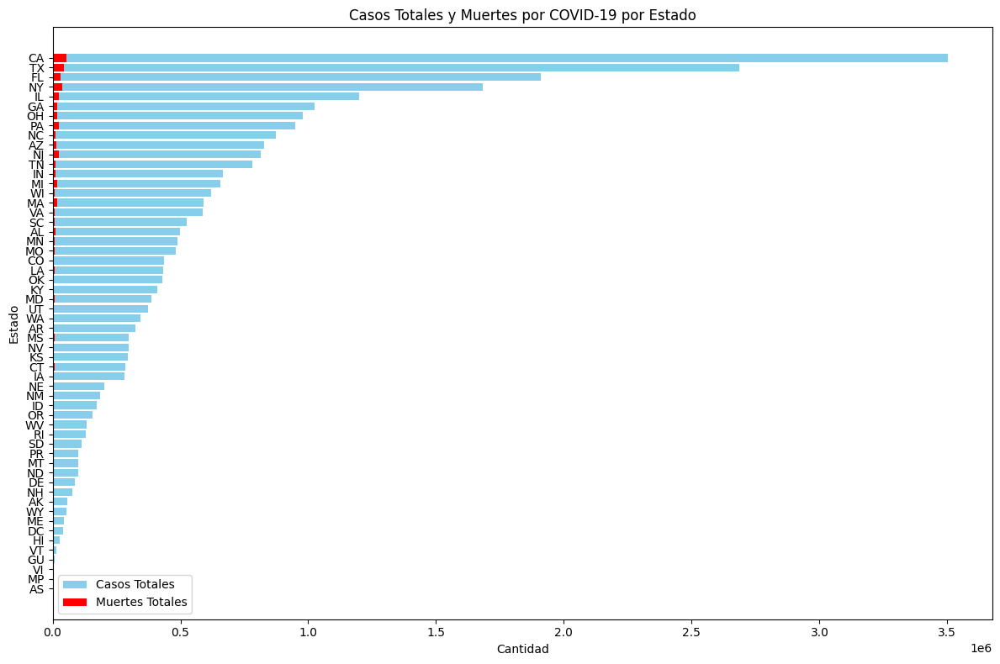

In [16]:
# Ordenar el DataFrame state_summary por la columna 'positive' en orden descendente
state_summary_sorted = state_summary.sort_values(by='positive', ascending=True)

# Graficar casos totales y muertes por estado en orden descendente
plt.figure(figsize=(12, 8))
plt.barh(state_summary_sorted['state'], state_summary_sorted['positive'], color='skyblue', label='Casos Totales')
plt.barh(state_summary_sorted['state'], state_summary_sorted['death'], color='red', label='Muertes Totales')
plt.title('Casos Totales y Muertes por COVID-19 por Estado')
plt.xlabel('Cantidad')
plt.ylabel('Estado')
plt.legend()
plt.tight_layout()
plt.show()
plt.close()


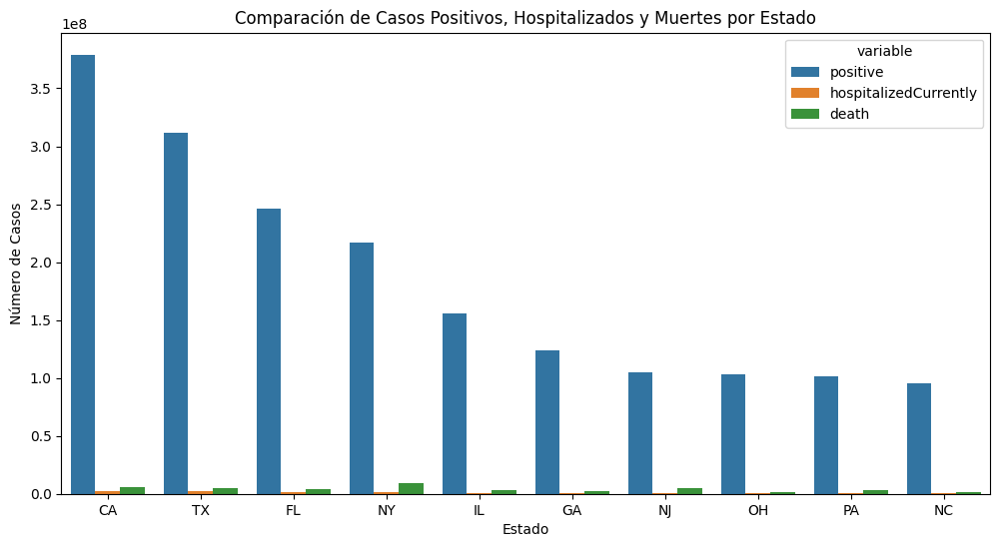

In [17]:
# Filtrar los datos para los estados más afectados
df_top_states = df.groupby('state').agg({'positive': 'sum', 'hospitalizedCurrently': 'sum', 'death': 'sum'}).reset_index()
df_top_states = df_top_states.sort_values('positive', ascending=False).head(10)

plt.figure(figsize=(12, 6)) 
# Crear el gráfico de barras apiladas
df_top_states_melt = df_top_states.melt(id_vars=['state'], value_vars=['positive', 'hospitalizedCurrently', 'death'])
sns.barplot(x='state', y='value', hue='variable', data=df_top_states_melt)
plt.title('Comparación de Casos Positivos, Hospitalizados y Muertes por Estado')
plt.xlabel('Estado')
plt.ylabel('Número de Casos')

plt.show()


Gráficos para observar la distribución de los casos positivos, hospitalizaciones actuales y muertes por estado.


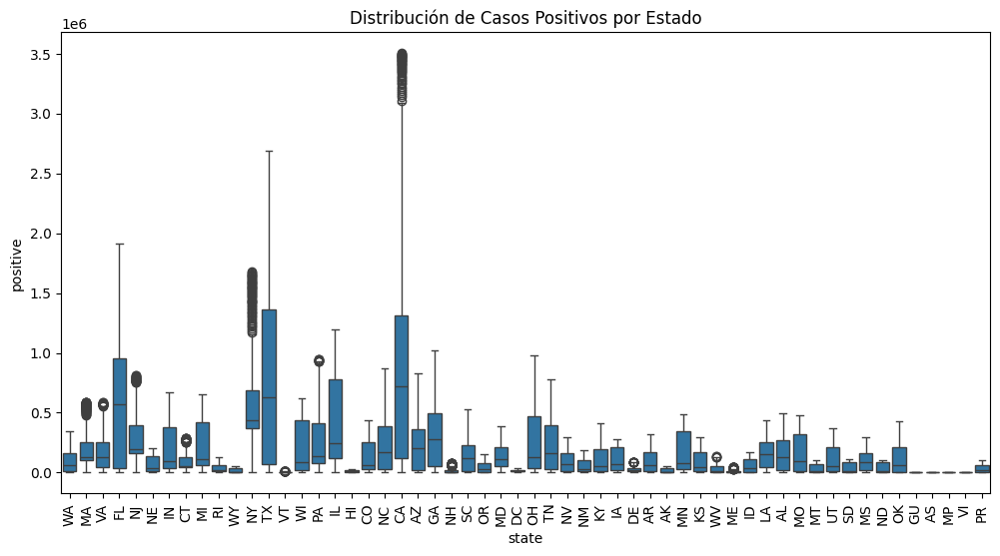

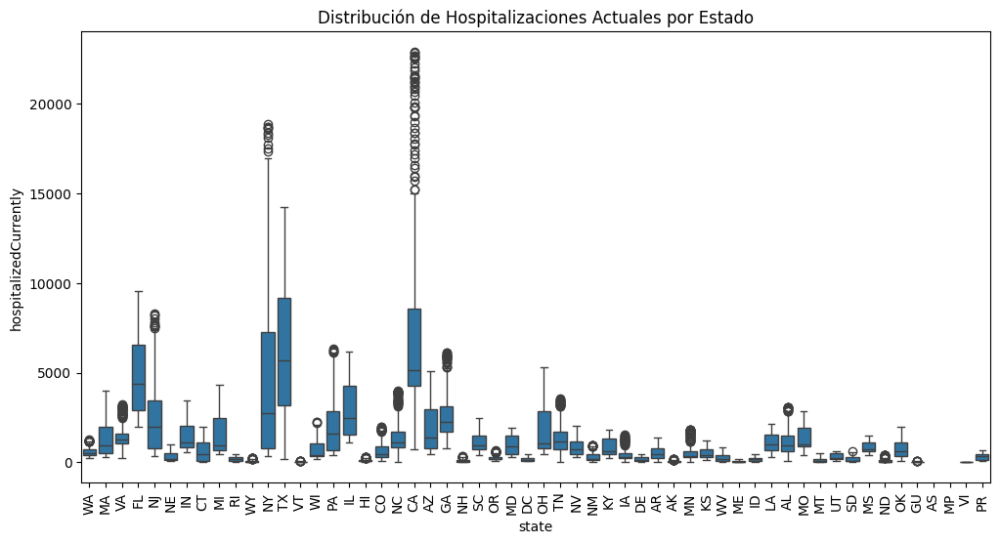

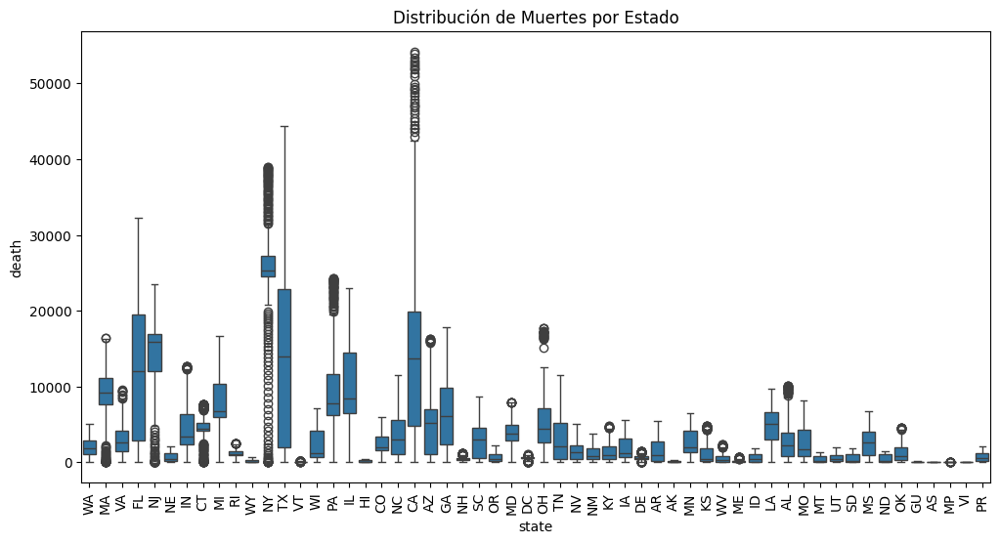

In [18]:
# Seleccionar las columnas relevantes
df_filtrado = df[['state', 'positive', 'negative', 'hospitalizedCurrently', 'death']]

# Crear un gráfico de box plot para los casos positivos
plt.figure(figsize=(12, 6))
sns.boxplot(x='state', y='positive', data=df_filtrado)
plt.title('Distribución de Casos Positivos por Estado')
plt.xticks(rotation=90)
plt.show()

# Crear un gráfico de box plot para las hospitalizaciones actuales
plt.figure(figsize=(12, 6))
sns.boxplot(x='state', y='hospitalizedCurrently', data=df_filtrado)
plt.title('Distribución de Hospitalizaciones Actuales por Estado')
plt.xticks(rotation=90)
plt.show()

# Crear un gráfico de box plot para las muertes
plt.figure(figsize=(12, 6))
sns.boxplot(x='state', y='death', data=df_filtrado)
plt.title('Distribución de Muertes por Estado')
plt.xticks(rotation=90)
plt.show()

*	California y New York presentaron mayores picos de casos positivos, hospitalizaciones y muertes que el resto.
*	California, Texas, Florida y New York son los estados que presentaron mayor número de casos, hospitalizaciones y muertes, además con una gran diferencia que los otros estados. Esto puede ser porque presentan una población mayor.

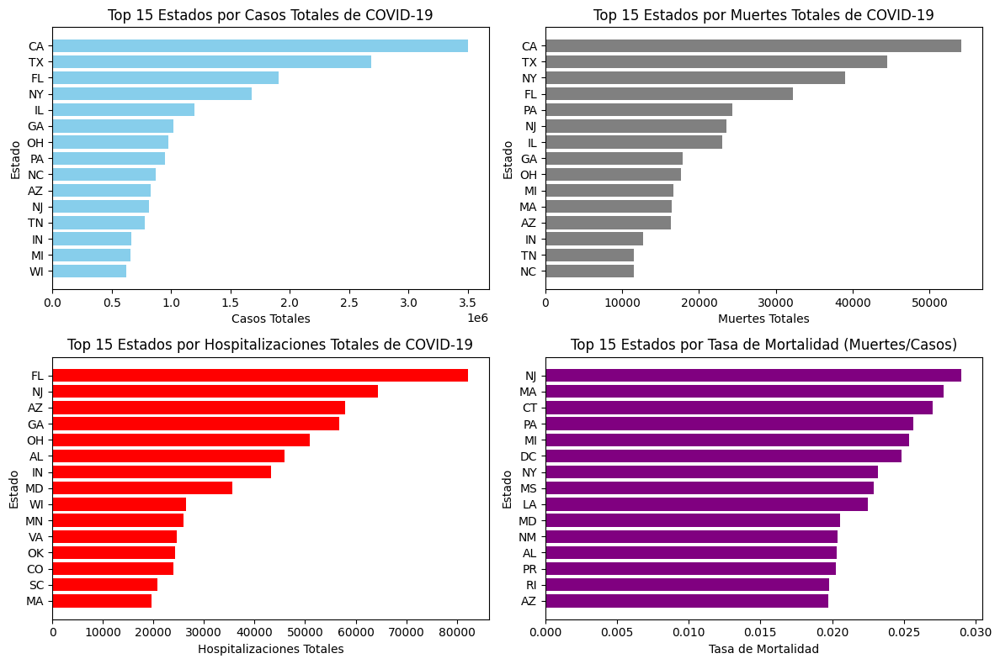

In [19]:
# Añadimos la columna de mortalidad al resumen por estados
state_summary['mortality_rate'] = state_summary['death'] / state_summary['positive']

# Calcular los 15 principales estados por casos totales, muertes y hospitalizaciones
top_cases = state_summary.nlargest(15, 'positive').sort_values(by='positive', ascending=True)
top_deaths = state_summary.nlargest(15, 'death').sort_values(by='death', ascending=True)
top_hospitalizations = state_summary.nlargest(15, 'hospitalizedIncrease').sort_values(by='hospitalizedIncrease', ascending=True)

# Calcular la tasa de mortalidad (muertes/casos) para los principales estados por mortalidad
top_mortality = state_summary.nlargest(15, 'mortality_rate').sort_values(by= 'mortality_rate', ascending=True)


# Configurar una figura con subgráficas 2x2
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Graficar los 10 principales estados por casos totales
axs[0, 0].barh(top_cases['state'], top_cases['positive'], color='skyblue')
axs[0, 0].set_title('Top 15 Estados por Casos Totales de COVID-19')
axs[0, 0].set_xlabel('Casos Totales')
axs[0, 0].set_ylabel('Estado')

# Graficar los 10 principales estados por muertes totales
axs[0, 1].barh(top_deaths['state'], top_deaths['death'], color='grey')
axs[0, 1].set_title('Top 15 Estados por Muertes Totales de COVID-19')
axs[0, 1].set_xlabel('Muertes Totales')
axs[0, 1].set_ylabel('Estado')

# Graficar los 10 principales estados por hospitalizaciones
axs[1, 0].barh(top_hospitalizations['state'], top_hospitalizations['hospitalizedIncrease'], color='red')
axs[1, 0].set_title('Top 15 Estados por Hospitalizaciones Totales de COVID-19')
axs[1, 0].set_xlabel('Hospitalizaciones Totales')
axs[1, 0].set_ylabel('Estado')

# Graficar la tasa de mortalidad
axs[1, 1].barh(top_mortality['state'], top_mortality['mortality_rate'], color='purple')
axs[1, 1].set_title('Top 15 Estados por Tasa de Mortalidad (Muertes/Casos)')
axs[1, 1].set_xlabel('Tasa de Mortalidad')
axs[1, 1].set_ylabel('Estado')

plt.tight_layout()
plt.show()



*	En los casos totales el top 5 esta conformado por los estados con mayor población.
*	Florida presento más casos que New York, sin embargo New York tuvo un mayor número total de muertes.
*	Los estados con una mayor tasa de Mortalidad (Muertes/Casos) son New Jersey, Massachusetts, Connecticut, Pensilvania y Michigan. Estos no son los estados con mayor número de casos, por lo que otros factores como el sistema de salud puede influir en la tasa de mortalidad.

In [20]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.layouts import gridplot

# Activar la salida en Jupyter
output_notebook()

# Crear la fuente de datos
source = ColumnDataSource(df)

# Gráfico de dispersión de Casos Positivos vs. Hospitalizaciones Actuales
p1 = figure(title="Positivos vs. Hospitalizaciones Actuales", height=600, width=600)
p1.scatter('positive', 'hospitalizedCurrently', source=source)
p1.xaxis.axis_label = 'Casos Positivos'
p1.yaxis.axis_label = 'Hospitalizaciones Actuales'

# Gráfico de dispersión de Casos Positivos vs. Muertes
p2 = figure(title="Positivos vs. Muertes", height=600, width=600)
p2.scatter('positive', 'death', source=source)
p2.xaxis.axis_label = 'Casos Positivos'
p2.yaxis.axis_label = 'Muertes'

# Agregar herramientas de hover
hover = HoverTool(tooltips=[("Estado", "@state"), ("Positivos", "@positive"), ("Hospitalizados", "@hospitalizedCurrently"), ("Muertes", "@death")])
p1.add_tools(hover)
p2.add_tools(hover)

# Mostrar los gráficos en un grid
grid = gridplot([[p1, p2]])
show(grid)


Loading BokehJS ...

In [21]:
#Gráfico de Barras Apiladas: compara el número de personas hospitalizadas, en la UCI y en ventiladores en un momento dado.
from bokeh.plotting import figure, show
from bokeh.transform import dodge
from bokeh.models import ColumnDataSource
from bokeh.palettes import Spectral6

# Agrupar por estado y calcular promedios
df_avg = df.groupby('state')[['hospitalizedCurrently', 'inIcuCurrently', 'onVentilatorCurrently']].mean().reset_index()

# Configurar los datos para el gráfico
source = ColumnDataSource(df_avg)

# Crear figura
p = figure(x_range=df_avg['state'], height=600, width = 1050, title="Comparación de Hospitalizaciones, UCI y Respiradores por Estado")

# Graficar barras
p.vbar(x=dodge('state', -0.25, range=p.x_range), top='hospitalizedCurrently', width=0.2, source=source, color=Spectral6[0], legend_label="Hospitalizados")
p.vbar(x=dodge('state', 0.0, range=p.x_range), top='inIcuCurrently', width=0.2, source=source, color=Spectral6[5], legend_label="En UCI")
p.vbar(x=dodge('state', 0.25, range=p.x_range), top='onVentilatorCurrently', width=0.2, source=source, color=Spectral6[4], legend_label="En Respirador")

# Configurar leyenda
p.legend.location = "top_right"
p.xgrid.grid_line_color = None
p.xaxis.major_label_orientation = 1.2

# Mostrar el gráfico
show(p)


*	California y Texas fueron los estados con mayor cantidad de hospitalizados y pacientes en UCI.
*	En Wisconsin la cantidad de pacientes con respirador fue mayor que los pacientes en UCI, esto puede ser por varios factores, como la falta de capacidad en la UCI.

In [22]:
#Gráfico de Barras Horizontal:compara la cantidad total de casos positivos con el número total de pruebas realizadas por estado.
from bokeh.plotting import figure, show
from bokeh.transform import factor_cmap

# Agrupar por estado
df_sum = df.groupby('state')[['positive', 'totalTestResults']].sum().reset_index()

# Crear figura
p = figure(y_range=df_sum['state'], height=800, width=1000, title="Comparación de Casos Positivos y Pruebas Totales por Estado")

# Graficar barras horizontales
p.hbar(y='state', right='positive', height=0.4, source=df_sum, color='navy', legend_label="Casos Positivos")
p.hbar(y='state', right='totalTestResults', height=0.2, source=df_sum, color='orange', legend_label="Pruebas Totales")

# Configurar leyenda y etiquetas
p.legend.location = "center_right"
p.xaxis.axis_label = "Número Total"
p.yaxis.axis_label = "Estado"

# Mostrar el gráfico
show(p)


*	Se puede observar que hay una gran diferencia de casos positivos respecto al total de pruebas. Esto podría ser por pruebas rutinarias, la buena gestión de cada estado, etc.

Gráfico de Líneas:mostrará los incrementos diarios de casos positivos, muertes y hospitalizaciones por estado.

In [23]:
#Gráfico de Líneas:mostrará los incrementos diarios de casos positivos, muertes y hospitalizaciones por estado.
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.palettes import Category20c

output_notebook()  # Para mostrar el gráfico en Jupyter Notebook
df_filtrado = df[['date', 'state', 'positive', 'negative', 'hospitalizedCurrently', 'death', 'positiveIncrease','deathIncrease', 'hospitalizedIncrease']]

# Crear figura
p = figure(x_axis_type="datetime", title="Incrementos Diarios de Casos Positivos, Muertes y Hospitalizaciones",
           height=700, width=1100)

# Colores para cada estado
colors = Category20c[20]

#estados_seleccionados = df['state'].unique()[:5]
estados_seleccionados = ['CA', 'NY', 'TX', 'NJ', 'MA', 'PA']

# Graficar la evolución de incrementos
for i, estado in enumerate(estados_seleccionados):
    df_estado = df_filtrado[df_filtrado['state'] == estado]

    # Crear un ColumnDataSource con la columna del nombre del estado
    source = ColumnDataSource(data={
        'date': df_estado['date'],
        'positiveIncrease': df_estado['positiveIncrease'],
        'deathIncrease': df_estado['deathIncrease'],
        'hospitalizedIncrease': df_estado['hospitalizedIncrease'],
        'estado': [estado] * len(df_estado)  # Columna con el nombre del estado
    })

    p.line('date', 'positiveIncrease', source=source, color=colors[i], legend_label=f"Positivos {estado}", line_width=2)
    p.line('date', 'deathIncrease', source=source, color=colors[i], legend_label=f"Muertes {estado}", line_dash="4 4", line_width=2)
    p.line('date', 'hospitalizedIncrease', source=source, color=colors[i], legend_label=f"Hospitalizaciones {estado}", line_dash="dotdash", line_width=2)

# Configurar leyenda y herramientas
p.legend.location = "top_left"
hover = HoverTool(tooltips=[("Estado", "@estado"), ("Incremento", "$y"), ("Fecha", "@date{%F}")],
                  formatters={'@date': 'datetime'}, mode='vline')
p.add_tools(hover)

# Mostrar el gráfico
show(p)



Loading BokehJS ...

Este gráfico muestra mayoritariamente tres olas, correspondientes al principio de la pandemia, al verano y a las vacaciones de Navidad. Hay un dato muy alto en noviembre que mostraremos un poco más adelante. Por lo que a continuación buscamos el día que, contando con todos los datos nacionales, existió mayor incidencia de casos.

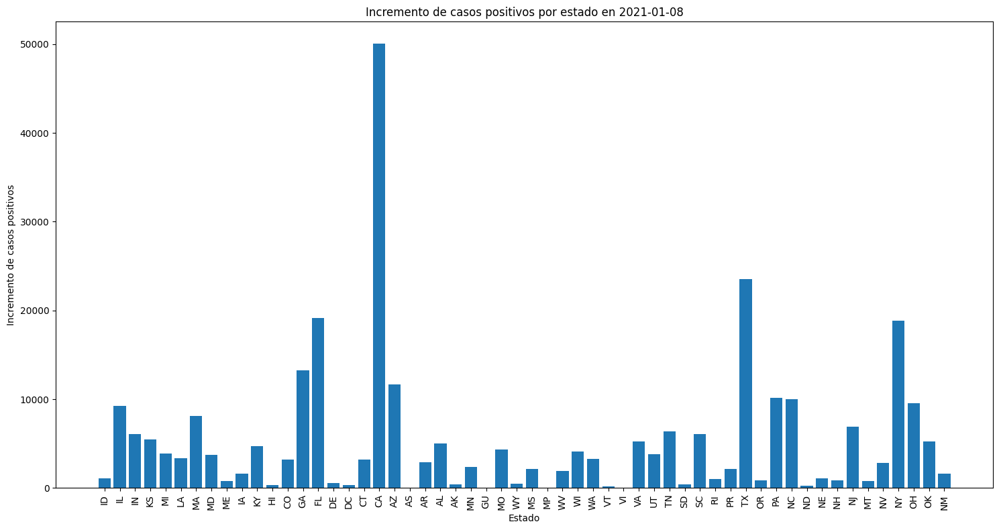

In [24]:
daily = df.copy()

daily['date'] = pd.to_datetime(daily['date'], format='%Y%m%d')


daily_increase = daily.groupby(daily['date'].dt.date)['positiveIncrease'].sum()


if not daily_increase.empty:

    max_increase_day = daily_increase.idxmax()


    max_day_data = daily[daily['date'].dt.date == max_increase_day]


    plt.figure(figsize=(15, 8))
    plt.bar(max_day_data['state'], max_day_data['positiveIncrease'])
    plt.title(f'Incremento de casos positivos por estado en {max_increase_day.strftime("%Y-%m-%d")}')
    plt.xlabel('Estado')
    plt.ylabel('Incremento de casos positivos')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()
else:
    print("No hay datos para generar la gráfica.")

Vemos que muestra el 8 de enero, teniendo en cuenta el período de incubación, estos casos se infectaron entre Nochebuena y Nochevieja. Por curiosidad, vemos cuál fue el segundo día con mayor incidencia estatal.

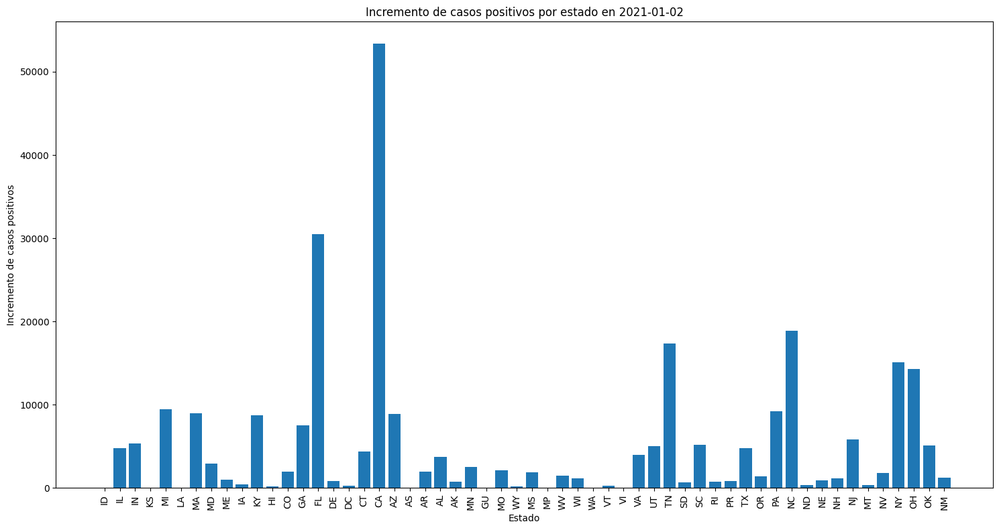

In [25]:
daily_increase = daily_increase.sort_values(ascending=False)

# Obtener el segundo día con el mayor incremento
second_max_increase_day = daily_increase.index[1]

# Filtrar los datos para el segundo día con el mayor incremento
second_max_day_data = daily[daily['date'].dt.date == second_max_increase_day]

# Crear la gráfica de barras
plt.figure(figsize=(15, 8))
plt.bar(second_max_day_data['state'], second_max_day_data['positiveIncrease'])
plt.title(f'Incremento de casos positivos por estado en {second_max_increase_day.strftime("%Y-%m-%d")}')
plt.xlabel('Estado')
plt.ylabel('Incremento de casos positivos')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

En este caso, vemos que el segundo día con mayor incidencia contando los datos nacionales, es el 2 de enero, seguimos viendo el impacto de la Navidad en este caso. Ahora, también por curiosidad, vemos qué ocurrió una semana después del 4 de julio para ver cómo se comportaron los estadounidenses en esta fiesta nacional. Así que vemos el impacto una semana después y buscamos en qué situación se encuentra ese día en el ranking de infecciones.  

In [26]:
# Encontrar el índice del 11 de julio de 2020
july_11_2020 = pd.Timestamp('2020-07-11')
july_11_2020_position = daily_increase.index.get_loc(july_11_2020.date())

# Imprimir información sobre el 11 de julio de 2020
print(f"El 11 de julio de 2020, el incremento de casos positivos fue: {daily_increase[july_11_2020.date()]}")
print(f"Este día se encuentra en el puesto {july_11_2020_position + 1} de los días con mayor incremento de casos positivos.")

# Filtrar los datos para el 11 de julio de 2020
july_11_2020_data = daily[daily['date'].dt.date == july_11_2020.date()]

# Encontrar el estado con el mayor incremento en el 11 de julio de 2020
july_11_2020_max = july_11_2020_data.loc[:, 'positiveIncrease'].max()
july_11_2020_max_state = july_11_2020_data.loc[july_11_2020_data['positiveIncrease'] == july_11_2020_max, 'state'].values[0]





El 11 de julio de 2020, el incremento de casos positivos fue: 62584
Este día se encuentra en el puesto 147 de los días con mayor incremento de casos positivos.


Ahora vamos a ver con código, el punto extremos que veíamos en la gráfica en noviembre. Evaluamos qué día exacto fue, cuántos positivos y en qué estado.

In [27]:

# Encontrar el día con el mayor incremento a nivel nacional
max_increase_day = daily.groupby('date')['positiveIncrease'].max().idxmax()

# Obtener los datos del día con el mayor incremento
max_day_data = daily.loc[daily['date'] == max_increase_day]

# Imprimir los resultados
print(f"El día con el mayor incremento de casos positivos (7174) fue el {max_increase_day.strftime('%Y-%m-%d')}")
print("El estado con el mayor incremento en ese día fue:")
print(max_day_data.loc[max_day_data['positiveIncrease'].idxmax(), 'state'])


El día con el mayor incremento de casos positivos (7174) fue el 2020-11-01
El estado con el mayor incremento en ese día fue:
TX


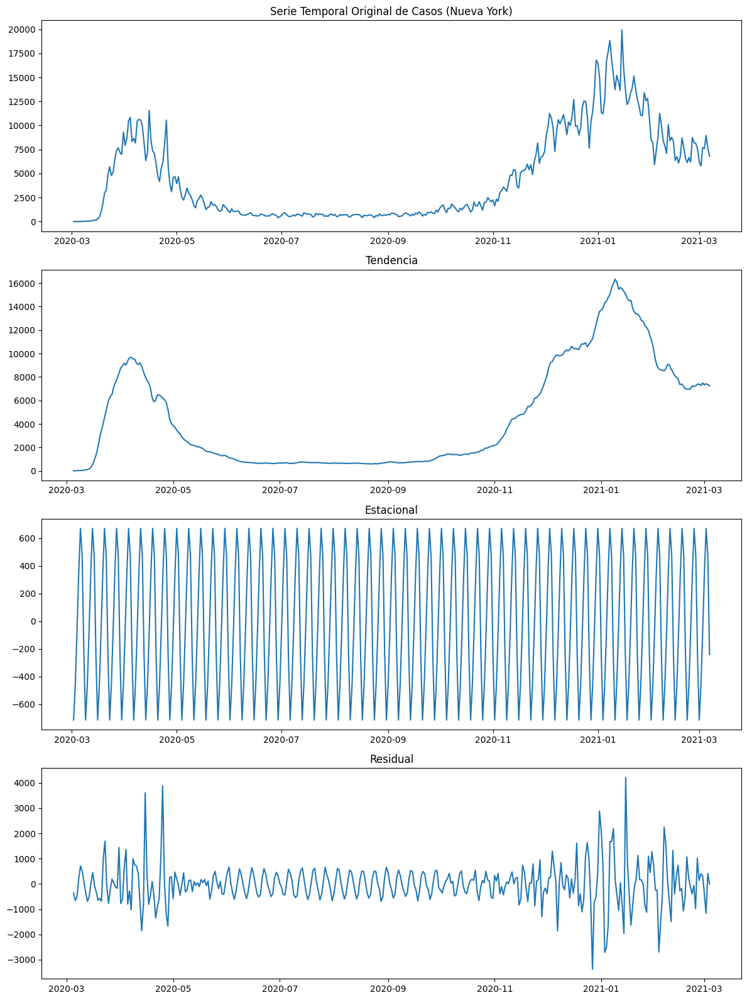

In [28]:
import matplotlib.dates as mdates

# Calcular promedios móviles para las métricas clave
state_df['rolling_avg_cases'] = state_df.groupby('state')['positiveIncrease'].rolling(window=14).mean().reset_index(0, drop=True)
state_df['rolling_avg_deaths'] = state_df.groupby('state')['deathIncrease'].rolling(window=14).mean().reset_index(0, drop=True)

# Calcular tasa de positividad de pruebas
state_df['positivity_rate'] = state_df['positiveIncrease'] / state_df['totalTestResultsIncrease']




# Realizar descomposición de series temporales
def decompose_time_series(state_data):
   
    state_data = state_data.set_index('date') 
    state_data.index = pd.to_datetime(state_data.index)  
    
    result = seasonal_decompose(state_data['positiveIncrease'], model='additive', period=7)

    return pd.DataFrame({
        'tendencia': result.trend,
        'estacional': result.seasonal,
        'residual': result.resid
    }, index=state_data.index)

# Ejemplo para un estado (por ejemplo, Nueva York)
ny_decomposition = decompose_time_series(state_df[state_df['state'] == 'NY'])

# Formatear las fechas en el eje x como dd-mm-yy
date_format = mdates.DateFormatter('%d-%m-%y')


# Visualizar descomposición de series temporales para Nueva York
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 16))
ax1.plot(ny_decomposition.index, state_df[state_df['state'] == 'NY']['positiveIncrease'])
ax1.set_title('Serie Temporal Original de Casos (Nueva York)')
ax2.plot(ny_decomposition.index, ny_decomposition['tendencia'])
ax2.set_title('Tendencia')
ax3.plot(ny_decomposition.index, ny_decomposition['estacional'])
ax3.set_title('Estacional')
ax4.plot(ny_decomposition.index, ny_decomposition['residual'])
ax4.set_title('Residual')
plt.tight_layout()
plt.show()



Realizamos una descomposición de una serie temporal utilizando la función `seasonal_decompose` de la biblioteca `statsmodels`. Esta descomposición desglosa la serie temporal original en tres componentes: tendencia, estacionalidad y residuo.

### Componente de Tendencia

La tendencia representa la progresión a largo plazo de la serie. En este caso, muestra un patrón claro de aumentos y disminuciones a lo largo del tiempo. Este componente captura la dirección general de los datos, suavizando las fluctuaciones a corto plazo.

### Componente Estacional

El componente estacional representa patrones recurrentes en intervalos fijos.

### Componente Residual

El residuo (o remanente) es lo que queda después de eliminar los componentes de tendencia y estacionalidad de la serie original. Representa:

- Fluctuaciones aleatorias
- Variaciones no explicadas
- Posibles deficiencias del modelo

In [31]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
import numpy as np
from sklearn.linear_model import LinearRegression



# Crear un ColumnDataSource
source = ColumnDataSource(data={
    'state': state_summary['state'],
    'positive': state_summary['positive'],
    'death': state_summary['death']
})

# gráfico Bokeh
p = figure(title="COVID-19 Casos Totales vs. Muertes Totales por Estado",
           x_axis_label="Casos Totales", y_axis_label="Muertes Totales",
           width=900, height=650)

# Scatter plot
p.scatter('positive', 'death', source=source, size=10, alpha=0.5)

# Añadimos etiquetas de Estado
p.text('positive', 'death', text='state', source=source, text_font_size="8pt", 
       text_align="right", text_baseline="bottom")

# Regresión lineal
X = np.array(state_summary['positive']).reshape(-1, 1)
y = np.array(state_summary['death'])

model = LinearRegression().fit(X, y)
slope = model.coef_[0]
intercept = model.intercept_

# Mostramos la línea de Regresión
p.line(state_summary['positive'], slope * np.array(state_summary['positive']) + intercept, color="blue", legend_label="Línea de Regresión")


hover = HoverTool()
hover.tooltips = [("State", "@state"), ("Cases", "@positive"), ("Deaths", "@death")]
p.add_tools(hover)
output_notebook()
show(p)


Loading BokehJS ...

### Línea de Regresión

Esta línea representa el mejor ajuste lineal a los datos, indicando la tendencia general entre el número de casos de COVID-19 y las muertes en los diferentes estados.

#### Interpretación

- **Por Encima de la Línea**: Un estado con un punto por encima de la línea de regresión podría tener factores que llevan a una tasa de mortalidad superior a la media, como problemas en el sistema de salud, una población más envejecida o intervenciones médicas retrasadas.
- **Por Debajo de la Línea**: Un estado con un punto por debajo de la línea podría tener un sistema de salud efectivo, una demografía más joven o un tratamiento proactivo, lo que resulta en menos muertes de las esperadas.

La posición relativa a la línea de regresión ayuda a identificar valores atípicos y tendencias en los datos que podrían explorarse más a fondo para entender las variaciones en las tasas de mortalidad entre los diferentes estados.



# Análisis del Impacto del COVID-19 en EEUU durante el Periodo Ene 2020 - Mar 2021

## Resumen

Este análisis examina el impacto del COVID-19 en el primer año en Estados Unidos, centrándose en datos a nivel estatal sobre casos, muertes, hospitalizaciones y métricas relacionadas.

## Hallazgos Clave

1. **Distribución de Casos**: California, Texas, Florida y Nueva York aparecen constantemente como los estados con el mayor número total de casos. Esto se alinea con sus grandes poblaciones, pero también sugiere que estos estados enfrentaron desafíos significativos en el control de la propagación del virus.

2. **Número de Muertes**: Nueva York, California, Texas y Florida reportaron el mayor número de muertes. Notablemente, el número de muertes de Nueva York es desproporcionadamente alto en comparación con su número de casos, lo que indica una tasa de mortalidad potencialmente más alta o desafíos en la respuesta temprana a la pandemia. Ocurre lo mismo en estados fronterizos con NY, por ejemplo New Jersey.

3. **Hospitalizaciones**: Florida, Nueva Jersey y Arizona reportaron el mayor número de hospitalizaciones. Esto sugiere que estos estados pueden haber enfrentado una tensión particular en sus sistemas de atención médica.

4. **Tasa de Mortalidad**: La tasa de mortalidad (muertes/casos) varía significativamente entre los estados. Nueva Jersey, Massachusetts,
Nueva York y Pensilvania muestran tasas de mortalidad más altas, lo que podría deberse a factores como la densidad de población, la demografía de edad, la capacidad del sistema de atención médica o las estrategias de respuesta temprana a la pandemia.

### Posibles causas de la alta incidencia en ciertos estados

- **Densidad poblacional**: Estados como Nueva York y California tienen grandes áreas metropolitanas con alta densidad poblacional.
- **Turismo y viajes**: Florida y California son destinos turísticos populares.
- **Centros de transporte**: Nueva York y Nueva Jersey son importantes nodos de transporte internacional.
- **Factores socioeconómicos**: Disparidades en el acceso a atención médica y la capacidad de trabajar desde casa.



### Posibles causas de las variaciones en las tasas de mortalidad

1. **Demografía**: Estados con poblaciones de mayor edad son potencialmente más vulnerables.
2. **Capacidad del sistema sanitario**: La saturación de hospitales en las primeras oleadas aumentó la mortalidad.
3. **Momento del brote**: Los estados afectados al principio de la pandemia tuvieron menos información y recursos.



## Conclusiones

El primer año de la pandemia de COVID-19 en EE. UU. reveló variaciones significativas en el impacto y la respuesta entre los estados. Si bien el tamaño de la población jugó un papel en el número total de casos, factores como el momento de la respuesta temprana, la capacidad del sistema de atención médica y la efectividad de las medidas de salud pública seguramente influyeron significativamente en los resultados.



## Documentación de la API y el significado de las columnas en  https://covidtracking.com/data/api
